In [1]:
from datetime import datetime, timedelta

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.signal import savgol_filter
from scipy.interpolate import interp1d

import plotly.graph_objs as go
from haversine import haversine, Unit
import plotly.express as px
import plotly.io as pio

import geopandas as gpd
import contextily as ctx

# Read engine and fuel data

In [2]:
engine1 = pd.read_csv("UIPA.HMD8310H.Engine1.csv")
engine2 = pd.read_csv("UIPA.HMD8310H.Engine2.csv")

/tmp/ipykernel_1801502/1235946815.py:1: DtypeWarning: Columns (152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,3

In [3]:
merged_df_all_columns = pd.merge(engine1, engine2, on='time', how='inner')
merged_df_all_columns["total_load"] = merged_df_all_columns["aIEngineLoad_x"] + merged_df_all_columns["aIEngineLoad_y"]

In [4]:
mgo = pd.read_csv("RemoteLevelThing_HMD8310.csv")
mgo["total_vol"] = mgo["MGO_STOR_TK_C_CALC_VOL"] + mgo["MGO_STOR_TK_S_CALC_VOL"] + mgo["NO1_MGO_SERV_TK_CALC_VOL"] + mgo["NO2_MGO_SERV_TK_CALC_VOL"]

/tmp/ipykernel_1801502/3850218066.py:1: DtypeWarning: Columns (2) have mixed types. Specify dtype option on import or set low_memory=False.
  mgo = pd.read_csv("RemoteLevelThing_HMD8310.csv")


In [5]:
engine_and_fuel_df_all_columns = pd.merge(merged_df_all_columns, mgo[["total_vol", "time"]], on='time', how='inner')

In [6]:
lng1 = pd.read_csv("LNGTank1Thing_HMD8310.csv")
lng2 = pd.read_csv("LNGTank2Thing_HMD8310.csv")
lng1["lng_total_vol"] = lng1["TK1_PRIMARY_CALC_VOL"] + lng2["TK2_PRIMARY_CALC_VOL"]

In [7]:
engine_and_lng_df_all_columns = pd.merge(merged_df_all_columns, lng1[["lng_total_vol", "time"]], on='time', how='inner')

In [8]:
non_preprocessed_all_fuel_df = pd.merge(engine_and_fuel_df_all_columns, engine_and_lng_df_all_columns[["lng_total_vol", "time"]], on="time", how="inner")
non_preprocessed_all_fuel_df = non_preprocessed_all_fuel_df[935:].copy()

In [9]:
non_preprocessed_all_fuel_df

,Unnamed: 0_x,time,aIAirTemperatureTCInlet_x,aIBaseDurationGasAdmission_x,aIChargeAirPressureEngineInlet_x,aIChargeAirSetpointBarMPa_x,aIChargeAirTemperatureEngineInlet_x,aICounterStarts_x,aICounterStartsX10000_x,aICrankcasePressure_x,...,dITurningGearEngagedSB_y,dIUPSAlarmAlarm_y,dIWastegateDriverFailureAlarm_y,dIWireBreakEmergencyStopFromRemote2Alarm_y,dIYardMainGasValveClosedInGasOperationGasTrip_y,dateTime_y,valuestreamname_y,total_load,total_vol,lng_total_vol
935,16799,2023-06-01T03:37:00Z,30.6,0.0,1.42,1.88,42.7,762.0,0.0,1.0,...,False,False,False,False,False,1.685591e+12,UIPA.HMD8310H.Engine2.VS,232.0,24.045,36.49
936,16800,2023-06-01T03:38:00Z,30.4,0.0,1.42,1.88,42.5,762.0,0.0,1.1,...,False,False,False,False,False,1.685591e+12,UIPA.HMD8310H.Engine2.VS,232.0,24.025,36.51
937,16801,2023-06-01T03:39:00Z,30.4,0.0,1.40,1.86,42.7,762.0,0.0,1.0,...,False,False,False,False,False,1.685591e+12,UIPA.HMD8310H.Engine2.VS,223.0,24.025,36.49
938,16802,2023-06-01T03:40:00Z,30.3,0.0,1.40,1.86,42.7,762.0,0.0,1.1,...,False,False,False,False,False,1.685591e+12,UIPA.HMD8310H.Engine2.VS,221.0,24.015,36.49
939,16803,2023-06-01T03:41:00Z,30.3,0.0,1.41,1.87,42.5,762.0,0.0,1.0,...,False,False,False,False,False,1.685591e+12,UIPA.HMD8310H.Engine2.VS,228.0,24.035,36.49
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
107220,39397,2023-08-25T07:05:00Z,36.2,0.0,1.01,1.01,44.3,813.0,0.0,0.2,...,False,False,False,False,False,1.692947e+12,UIPA.HMD8310H.Engine2.VS,273.0,41.000,53.52
107221,39398,2023-08-25T07:06:00Z,36.4,0.0,1.01,1.01,44.3,813.0,0.0,0.1,...,False,False,False,False,False,1.692947e+12,UIPA.HMD8310H.Engine2.VS,293.0,41.000,53.52
107222,39399,2023-08-25T07:07:00Z,36.3,0.0,1.01,1.01,44.4,813.0,0.0,0.1,...,False,False,False,False,False,1.692947e+12,UIPA.HMD8310H.Engine2.VS,273.0,41.000,53.52
107223,39400,2023-08-25T07:08:00Z,36.4,0.0,1.01,1.01,44.4,813.0,0.0,0.2,...,False,False,False,False,False,1.692947e+12,UIPA.HMD8310H.Engine2.VS,271.0,41.000,53.52


In [10]:
time_diffs = pd.to_datetime(non_preprocessed_all_fuel_df["time"]).diff()

# Filter out differences greater than 1 minute
greater_than_one_minute = time_diffs[time_diffs > pd.Timedelta(minutes=1)]
print(greater_than_one_minute)

6937     0 days 00:08:00
29495    2 days 00:17:00
98615    0 days 03:13:00
98634    0 days 00:02:00
98646    0 days 00:48:00
98649    0 days 00:03:00
98651    0 days 00:04:00
98663    0 days 00:24:00
98664    0 days 00:17:00
98669    0 days 00:20:00
98893    6 days 18:47:00
98897    0 days 19:30:00
104657   1 days 06:22:00
104676   0 days 00:04:00
104715   0 days 00:03:00
105746   0 days 05:57:00
Name: time, dtype: timedelta64[ns]


# Use navigation data

In [11]:
navthing = pd.read_csv("NavigationThing_HMD8310.csv")

/tmp/ipykernel_1801502/3248210917.py:1: DtypeWarning: Columns (17) have mixed types. Specify dtype option on import or set low_memory=False.
  navthing = pd.read_csv("NavigationThing_HMD8310.csv")


In [12]:
nav_fuel_df = pd.merge(non_preprocessed_all_fuel_df, navthing, on="time", how="inner")

In [13]:
# Create Plotly trace for the interpolated line
trace = go.Scatter(
    y=nav_fuel_df["total_vol"],
    mode='lines',
    name='Interpolated Line'
)

# Create layout
layout = go.Layout(
    title='Interpolated Line Plot',
    xaxis=dict(title='X-axis Label'),
    yaxis=dict(title='Y-axis Label'),
    hovermode='closest'
)

# Create figure object
fig = go.Figure(data=[trace], layout=layout)

pio.write_image(fig, 'mgo.png',scale=6, width=720, height=480)

# Display the plot
fig.show()

In [14]:
# Create Plotly trace for the interpolated line
trace = go.Scatter(
    y=nav_fuel_df["CurrentLon"],
    mode='lines',
    name='Interpolated Line'
)

# Create layout
layout = go.Layout(
    title='Interpolated Line Plot',
    xaxis=dict(title='X-axis Label'),
    yaxis=dict(title='Y-axis Label'),
    hovermode='closest'
)

# Create figure object
fig = go.Figure(data=[trace], layout=layout)

pio.write_image(fig, 'lon.png',scale=6, width=720, height=480)

# Display the plot
fig.show()

In [15]:
nav_fuel_df.loc[0, ["CurrentLat", "CurrentLon"]]

CurrentLat     35.457468
CurrentLon    129.359452
Name: 0, dtype: object

In [16]:
# There is a missing value at 95431
print(nav_fuel_df.loc[95430:95432, "CurrentLat"])
nav_fuel_df.loc[95431, "CurrentLat"] = (nav_fuel_df.loc[95430, "CurrentLat"]+nav_fuel_df.loc[95432, "CurrentLat"])/2
nav_fuel_df.loc[95431, "CurrentLat"]

95430    34.372638
95431          NaN
95432    34.367268
Name: CurrentLat, dtype: float64


34.36995333333333

## Detect movement by only latitude or longitude

In [17]:
import numpy as np

# Function to detect ship movement
def detect_ship_movement(latitudes, threshold=0.05):
    """
    Identifies segments of significant ship movement.

    Parameters:
        latitudes (list or np.array): Array of latitude values.
        threshold (float): Degree change to consider significant movement.

    Returns:
        list of tuples: List of (start_idx, end_idx) for each movement segment.
    """
    idle_latitude = latitudes[0]  # Assumption: first latitude is the idle one
    movement_segments = []
    moving = False
    start_idx = 0

    for i, lat in enumerate(latitudes):
        if abs(lat - idle_latitude) > threshold:
            if not moving:
                moving = True
                start_idx = i
        else:
            if moving:
                moving = False
                movement_segments.append((start_idx, i - 1))
    
    return movement_segments

# Example usage:
movement_segments = detect_ship_movement(nav_fuel_df["CurrentLon"], threshold=0.05)
print("Movement Segments:", movement_segments)

Movement Segments: [(9966, 10164), (15663, 15693), (15767, 15889), (15934, 15965), (21754, 21823), (25742, 25817), (25849, 25939), (26003, 26051), (32918, 33141), (76162, 76354), (94975, 94981), (95026, 95430), (95432, 97957), (103722, 103769)]


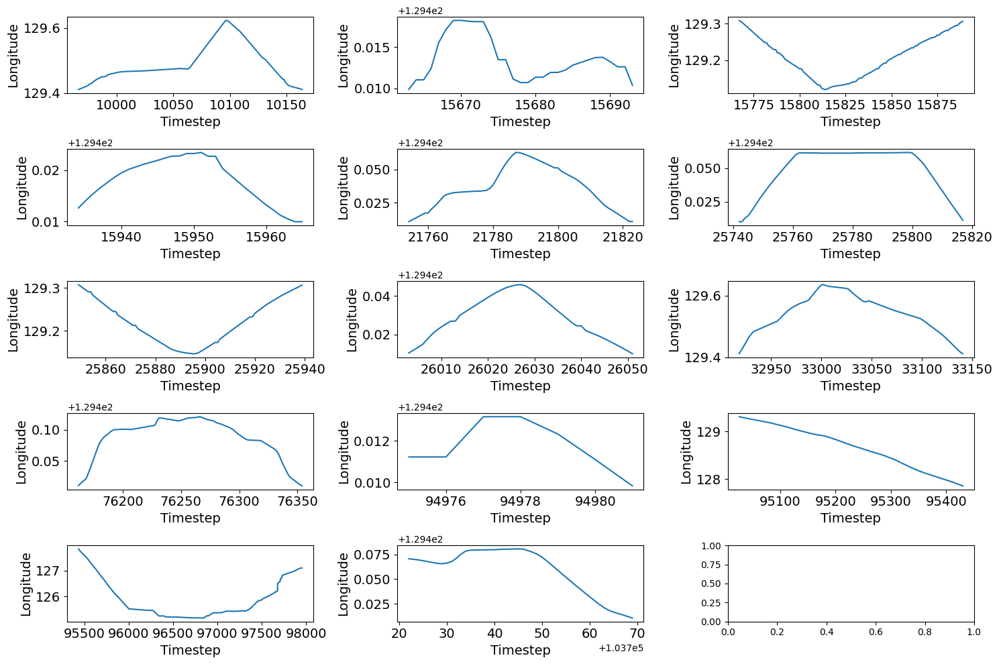

In [18]:
fig, axes = plt.subplots(int(np.ceil(len(movement_segments)/3)), 3, figsize=(15, 10))

summary_df = pd.DataFrame()

sns.set_style("darkgrid")

for i, idxs in enumerate(movement_segments):
   start_idx, end_idx = idxs
   row = i // 3
   col = i % 3
   ax = axes[row, col]
   ax.plot(nav_fuel_df.loc[start_idx:end_idx, "CurrentLon"])
   # ax.set_title(f'Latitude values')
   ax.set_xlabel('Timestep', fontsize=14)
   ax.set_ylabel('Longitude', fontsize=14)

   # Set the font size for x and y ticks
   ax.tick_params(axis='both', which='major', labelsize=14)


plt.tight_layout()
plt.show()

## Detect movement by distance with haversine

In [19]:
nav_fuel_df['shifted_lon'] = nav_fuel_df['CurrentLon'].shift(-1)
nav_fuel_df['shifted_lat'] = nav_fuel_df['CurrentLat'].shift(-1)

# Apply the haversine function
nav_fuel_df['distance'] = nav_fuel_df.apply(lambda row: haversine((row['CurrentLat'], row['CurrentLon']), 
                                                (row['shifted_lat'], row['shifted_lon']), 
                                                unit=Unit.KILOMETERS), axis=1)

In [20]:
def detect_ship_movement(latitudes, longitudes, distance_threshold=1.0):
    """
    Identifies segments of significant ship movement based on latitude and longitude.

    Parameters:
        latitudes (list or np.array): Array of latitude values.
        longitudes (list or np.array): Array of longitude values.
        distance_threshold (float): Distance change (in kilometers) to consider significant movement.

    Returns:
        list of tuples: List of (start_idx, end_idx) for each movement segment.
    """
    movement_segments = []
    moving = False
    start_idx = 0
    initial_lat, initial_lon = latitudes[0], longitudes[0]

    for i in range(1, len(latitudes)):
        distance = haversine((initial_lat, initial_lon), (latitudes[i], longitudes[i]))
        if distance > distance_threshold:
            if not moving:
                moving = True
                start_idx = i - 1
        else:
            if moving:
                moving = False
                movement_segments.append((start_idx, i - 1))
    
    return movement_segments

# Example usage:
latitudes = nav_fuel_df["CurrentLat"].values
longitudes = nav_fuel_df["CurrentLon"].values
movement_segments = detect_ship_movement(latitudes, longitudes, distance_threshold=1.0)
print("Movement Segments:", movement_segments)

Movement Segments: [(9951, 10177), (15648, 15981), (21668, 21839), (25727, 26064), (32908, 33158), (33232, 33369), (36167, 36218), (60612, 60691), (76147, 76368), (94956, 95430), (95431, 97957), (103721, 103779)]


In [21]:
def total_distance_traveled(latitudes, longitudes):
    """
    Calculates the total distance traveled by the ship.

    Parameters:
        latitudes (list or np.array): Array of latitude values.
        longitudes (list or np.array): Array of longitude values.

    Returns:
        float: Total distance traveled in kilometers.
    """
    total_distance = 0.0

    for i in range(1, len(latitudes)):
        total_distance += haversine((latitudes[i - 1], longitudes[i - 1]), (latitudes[i], longitudes[i]))

    return total_distance

dfs = []

for start_idx, end_idx in movement_segments:
    # Create a GeoDataFrame with unfiltered distances
    df = nav_fuel_df.loc[start_idx:end_idx].copy()
    if df["CurrentLon"].isna().sum() > 0:
       df["CurrentLon"] = df["CurrentLon"].bfill()
    total_distance = total_distance_traveled(df["CurrentLat"].values, df["CurrentLon"].values)
    dfs.append(df)
    print(total_distance)

61.153759493485445
132.06653389916264
49.897578184939995
128.59033035077059
85.43435084420163
17.26579363558635
17.484516172245296
19.226186815058032
69.9411137855181
203.38064429210183
627.0818730027161
33.75623087029686


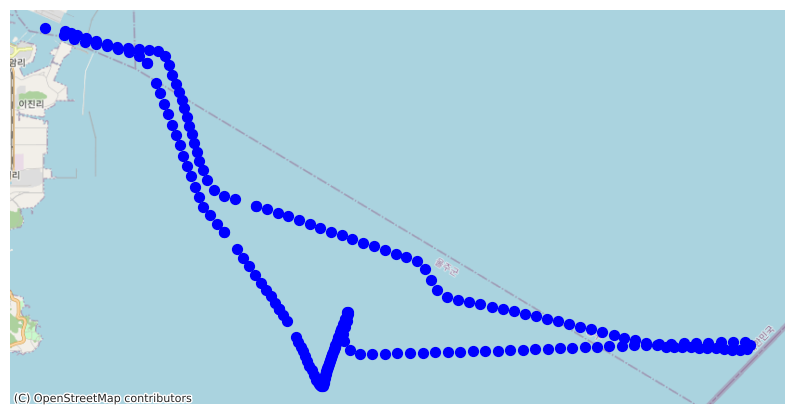

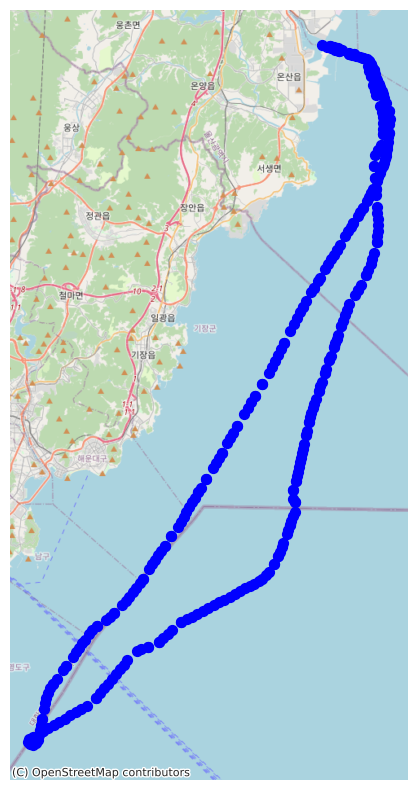

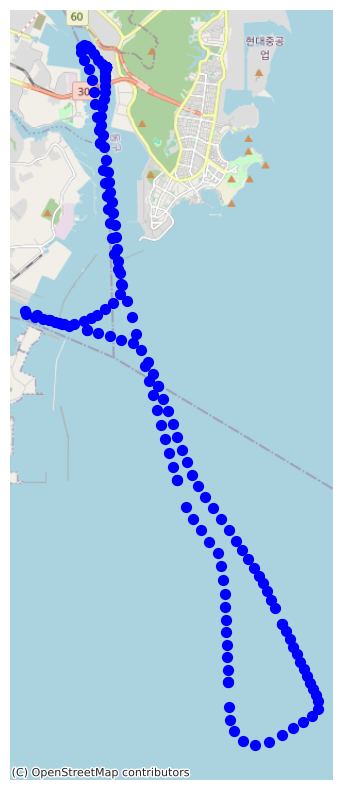

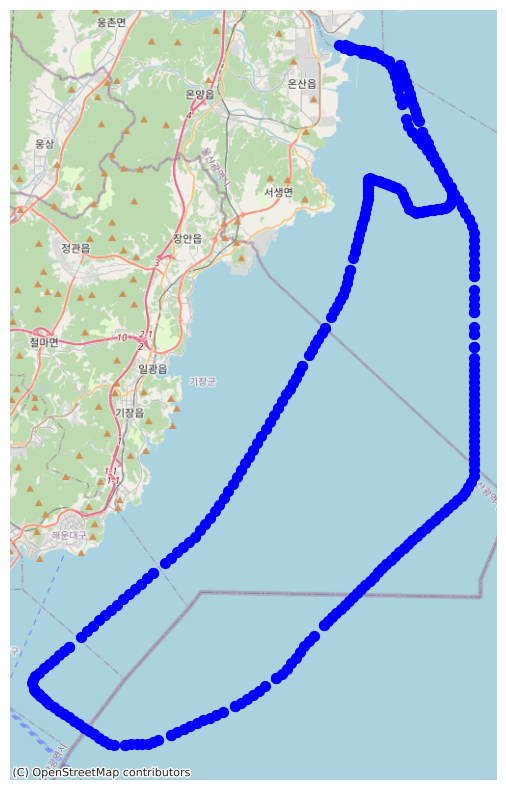

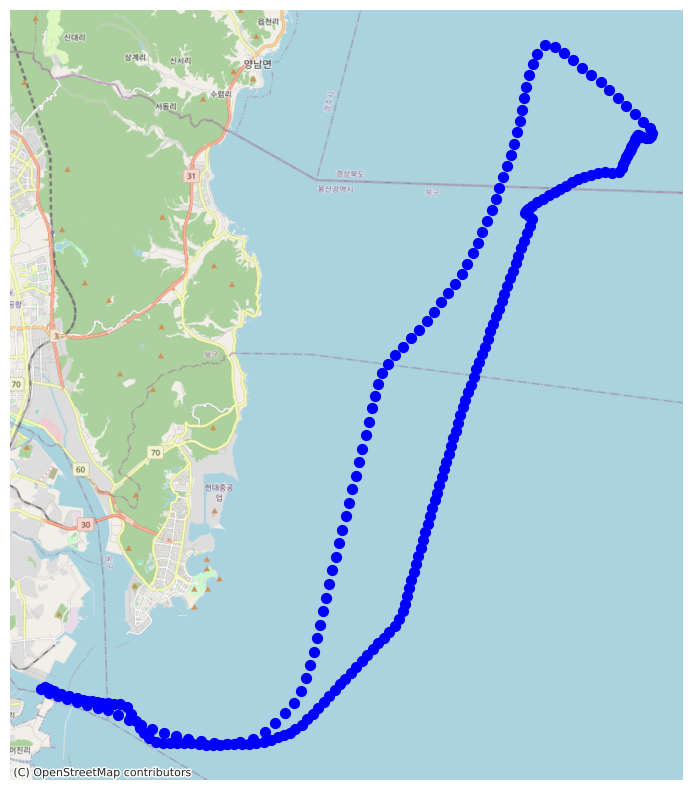

...

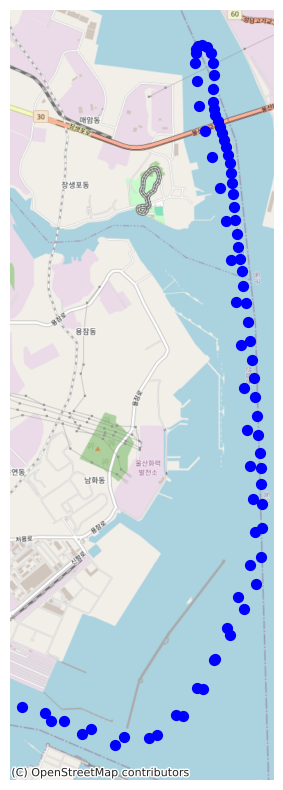

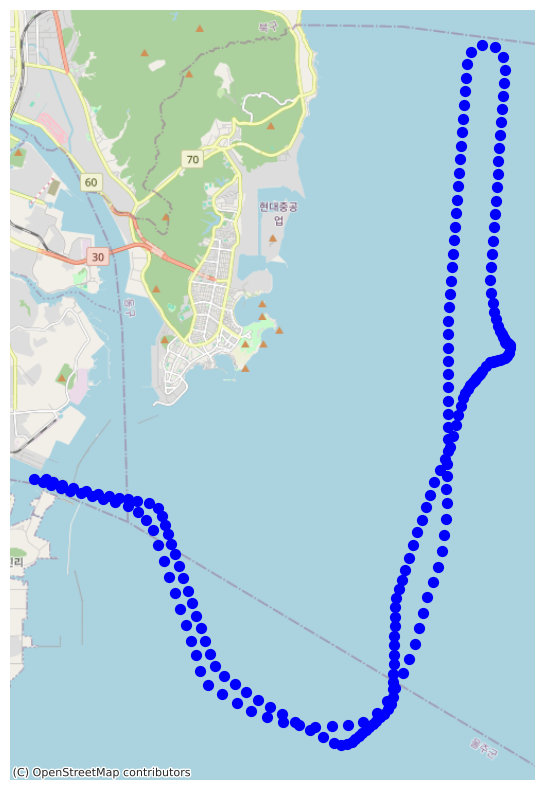

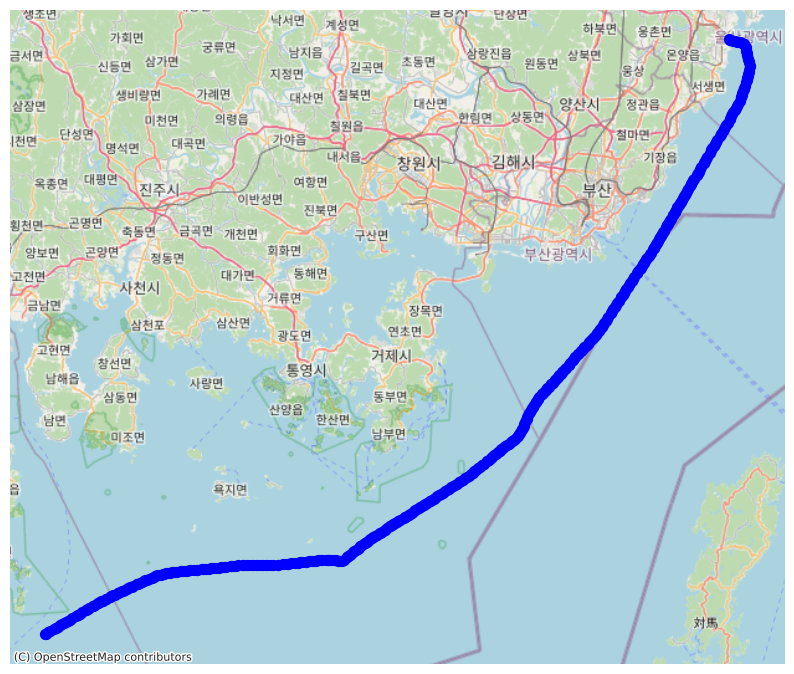

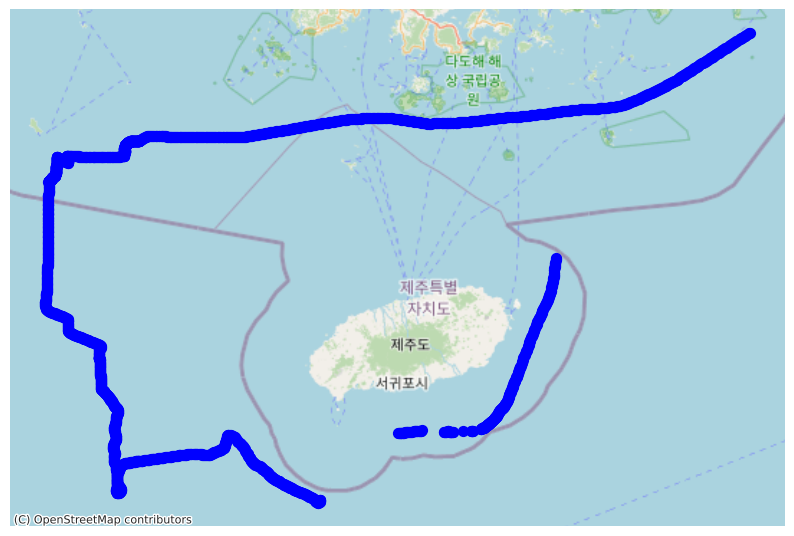

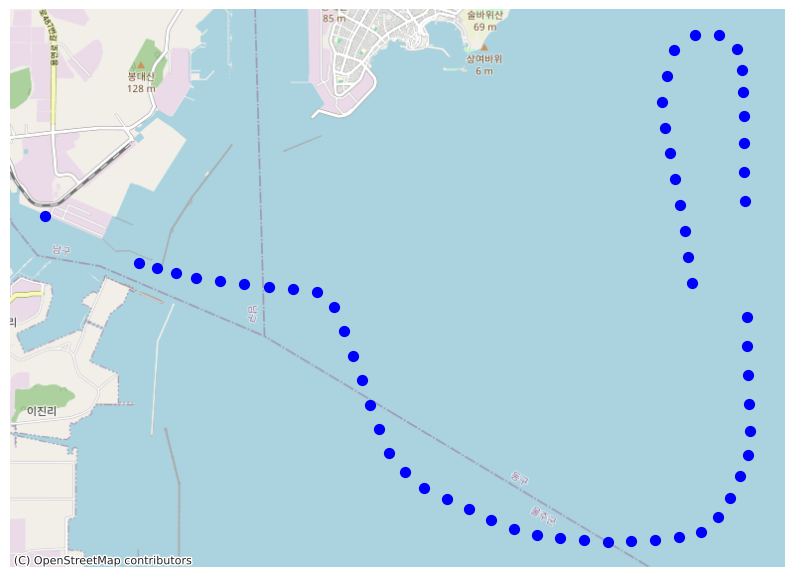

In [22]:
for start_idx, end_idx in movement_segments:
    # Create a GeoDataFrame with unfiltered distances
    df = nav_fuel_df.loc[start_idx:end_idx].copy()
    gdf = gpd.GeoDataFrame(
        df, geometry=gpd.points_from_xy(df.CurrentLon, df.CurrentLat),
        crs="EPSG:4326"  # WGS 84 latitude-longitude projection
    )

    # Convert to Web Mercator projection for use with contextily
    gdf = gdf.to_crs(epsg=3857)

    # Plotting
    fig, ax = plt.subplots(figsize=(10, 10))
    gdf.plot(ax=ax, color='blue', marker='o', markersize=50)  # Plot all points in blue

    # Highlight starts and ends
    # starts = gdf[gdf['start_idx']]
    # ends = gdf[gdf['end_idx']]
    # starts.plot(ax=ax, color='green', marker='^', markersize=100)  # Start points in green
    # ends.plot(ax=ax, color='red', marker='X', markersize=100)  # End points in red

    ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)  # Adding a base map
    ax.set_axis_off()
    plt.show()

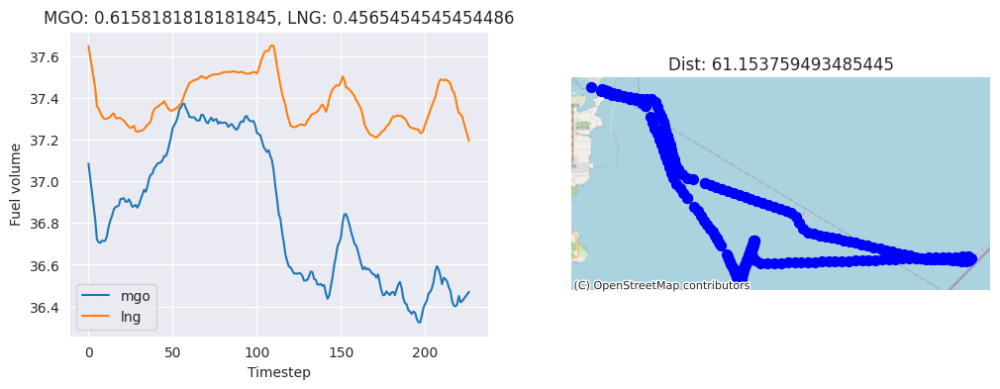

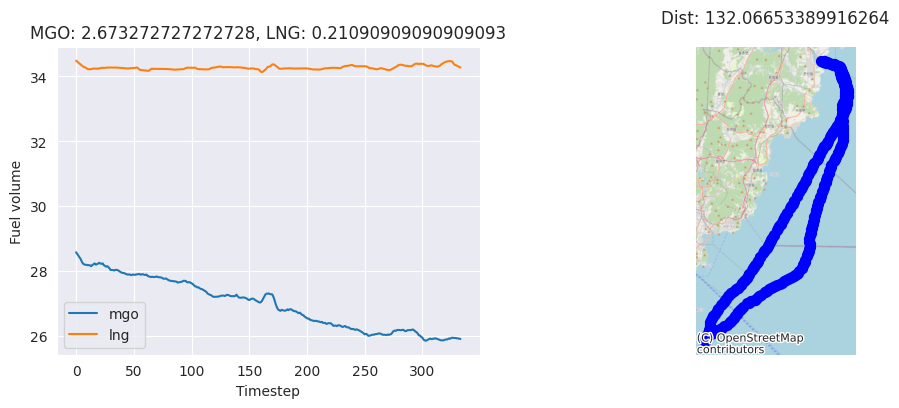

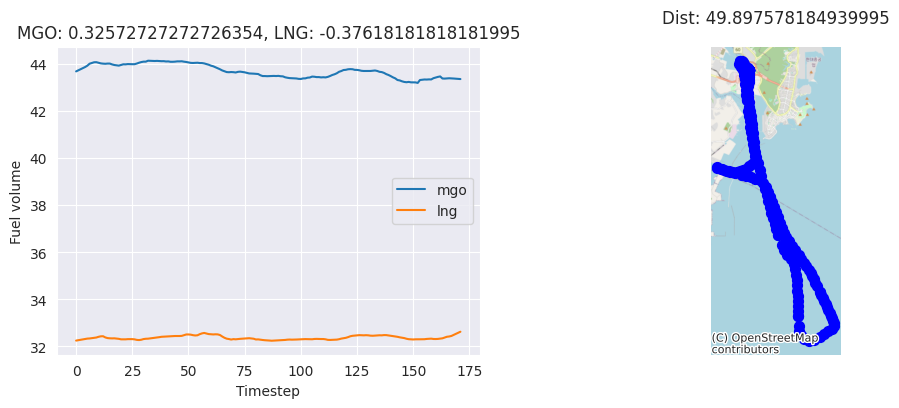

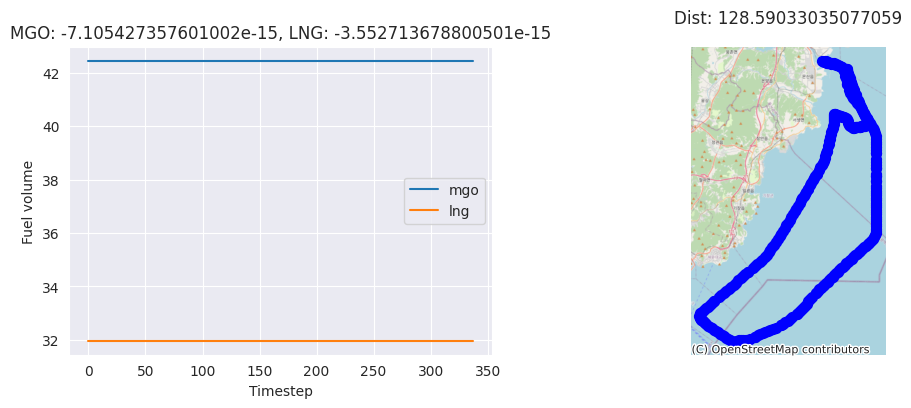

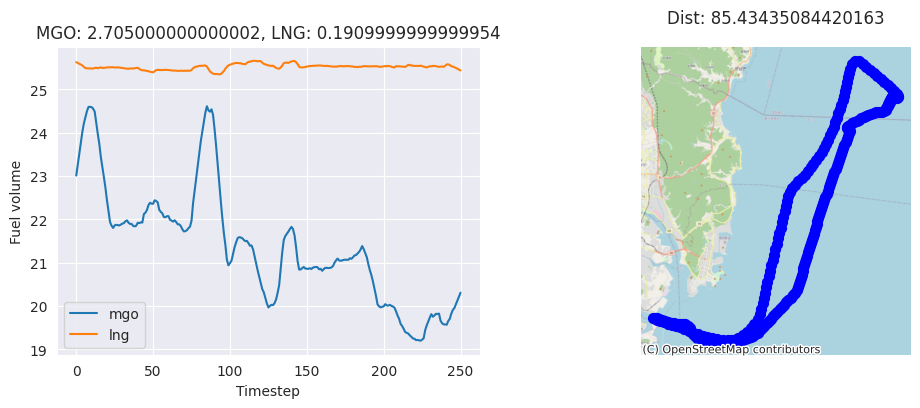

...

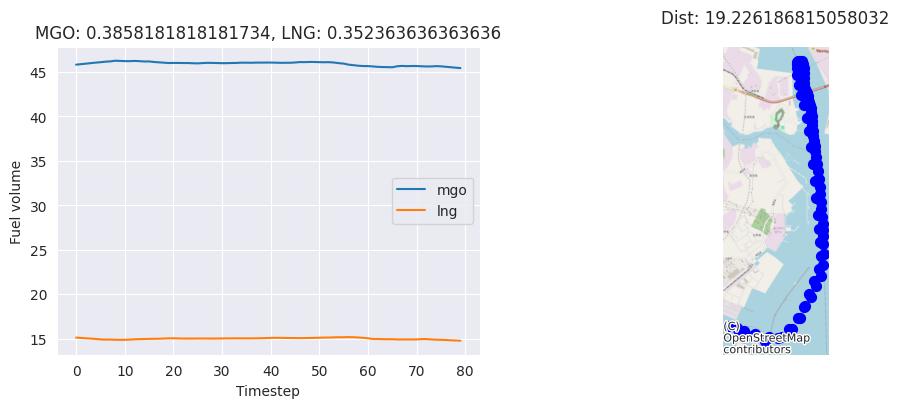

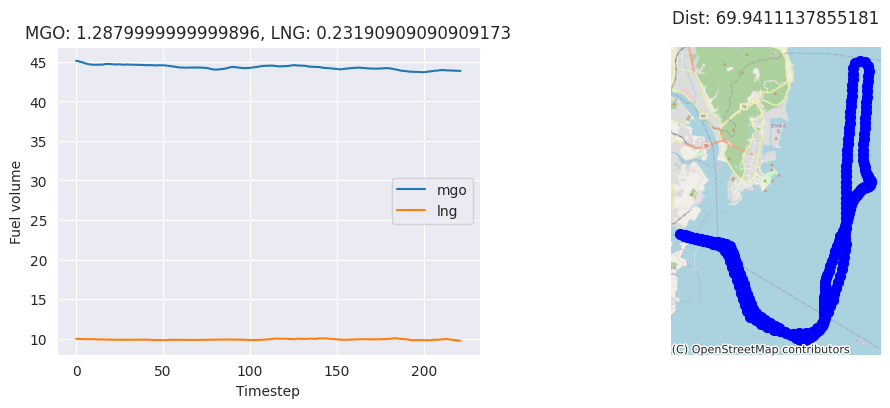

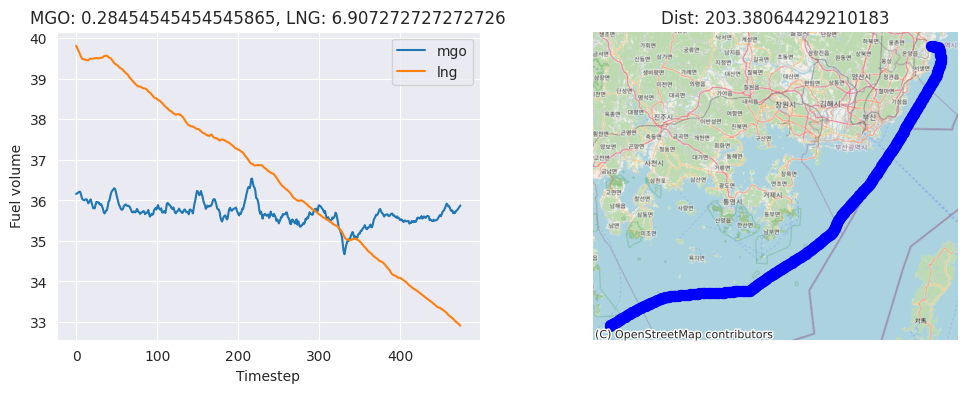

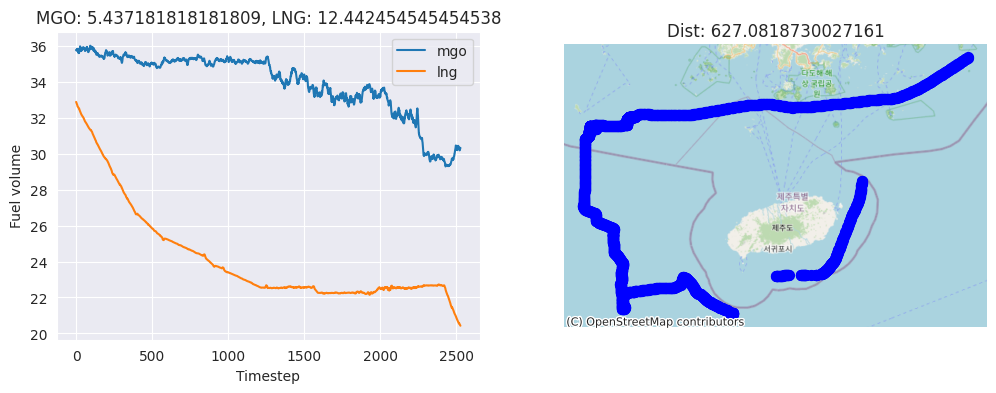

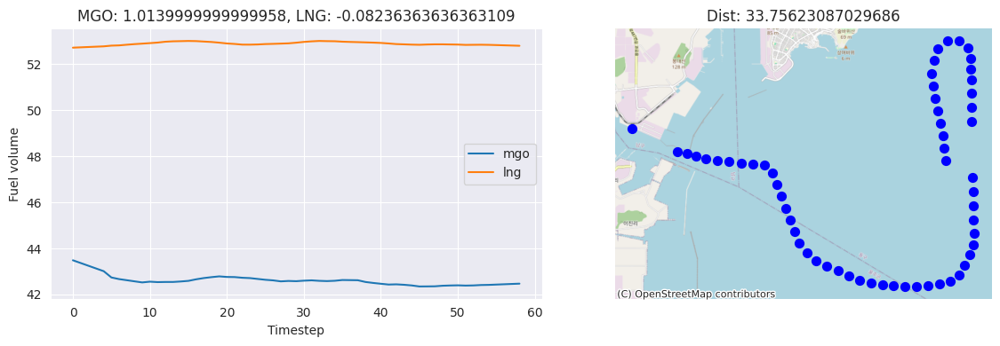

In [23]:
summary_df = pd.DataFrame()

for i, idxs in enumerate(movement_segments):
   fig, axes = plt.subplots(1, 2, figsize=(12, 4))
   start_idx, end_idx = idxs
   row = 0
   col = i % 2

   volume_col = 0
   map_col = 1

   # Create a GeoDataFrame with unfiltered distances
   df = nav_fuel_df.loc[start_idx:end_idx].copy()
   if df["CurrentLon"].isna().sum() > 0:
      df["CurrentLon"] = df["CurrentLon"].bfill()
   total_distance = total_distance_traveled(df["CurrentLat"].values, df["CurrentLon"].values)
   dfs.append(df)
   
   ax = axes[volume_col]

   smoothed_mgo_volume = savgol_filter(df["total_vol"], window_length=10, polyorder=1)
   smoothed_lng_volume = savgol_filter(df["lng_total_vol"], window_length=10, polyorder=1)

   mgo_consumed = smoothed_mgo_volume[0] - smoothed_mgo_volume[-1]
   lng_consumed = smoothed_lng_volume[0] - smoothed_lng_volume[-1]


   # mgo_consumed = df["total_vol"].max() - df["total_vol"].min()
   # lng_consumed = df["lng_total_vol"].max() - df["lng_total_vol"].min()
   # ax.plot(df["total_vol"])
   # ax.plot(df["lng_total_vol"])
   ax.plot(smoothed_mgo_volume)
   ax.plot(smoothed_lng_volume)
   ax.set_title(f'MGO: {mgo_consumed}, LNG: {lng_consumed}')
   ax.set_xlabel('Timestep')
   labels = ["mgo", "lng"]
   ax.set_ylabel('Fuel volume')
   ax.legend(labels)

   ax = axes[map_col]

   gdf = gpd.GeoDataFrame(
      df, geometry=gpd.points_from_xy(df.CurrentLon, df.CurrentLat),
      crs="EPSG:4326"  # WGS 84 latitude-longitude projection
   )

   # Convert to Web Mercator projection for use with contextily
   gdf = gdf.to_crs(epsg=3857)

   # Plotting
   gdf.plot(ax=ax, color='blue', marker='o', markersize=50)  # Plot all points in blue

   # Highlight starts and ends
   # starts = gdf[gdf['start_idx']]
   # ends = gdf[gdf['end_idx']]
   # starts.plot(ax=ax, color='green', marker='^', markersize=100)  # Start points in green
   # ends.plot(ax=ax, color='red', marker='X', markersize=100)  # End points in red

   ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)  # Adding a base map
   ax.set_title(f'Dist: {total_distance}')
   ax.set_axis_off()

   summary_df.loc[i, "start_idx"] = start_idx
   summary_df.loc[i, "end_idx"] = end_idx
   summary_df.loc[i, "mgo_consumed(m3)"] = mgo_consumed
   summary_df.loc[i, "lng_consumed(m3)"] = lng_consumed
   summary_df.loc[i, "total_distance(km)"] = total_distance
   summary_df.loc[i, "trip_time(minutes)"] = end_idx-start_idx

plt.tight_layout()
plt.show()

In [24]:
# summary_df.to_csv("trips_summary.csv", index=False)

In [25]:
summary_df

,start_idx,end_idx,mgo_consumed(m3),lng_consumed(m3),total_distance(km),trip_time(minutes)
0,9951.0,10177.0,6.158182e-01,4.565455e-01,61.153759,226.0
1,15648.0,15981.0,2.673273e+00,2.109091e-01,132.066534,333.0
2,21668.0,21839.0,3.257273e-01,-3.761818e-01,49.897578,171.0
3,25727.0,26064.0,-7.105427e-15,-3.552714e-15,128.590330,337.0
4,32908.0,33158.0,2.705000e+00,1.910000e-01,85.434351,250.0
5,33232.0,33369.0,2.019364e+00,3.565455e-01,17.265794,137.0
6,36167.0,36218.0,-4.282727e-01,-2.290909e-02,17.484516,51.0
7,60612.0,60691.0,3.858182e-01,3.523636e-01,19.226187,79.0
8,76147.0,76368.0,1.288000e+00,2.319091e-01,69.941114,221.0
9,94956.0,95430.0,2.845455e-01,6.907273e+00,203.380644,474.0


# Play with filtering for MGO

In [26]:
segment_to_use = movement_segments[11]
start_idx = segment_to_use[0]
end_idx = segment_to_use[1]

In [224]:
# Create Plotly trace for the interpolated line
margin_start = 1000
margin_end = 1000
trace = go.Scatter(
    y=nav_fuel_df.loc[start_idx-margin_start:end_idx+margin_end]["total_vol"],
    x=nav_fuel_df.index[start_idx-margin_start:end_idx+margin_end],
    mode='lines',
    name='Interpolated Line'
)

# Create layout
layout = go.Layout(
    title='Interpolated Line Plot',
    xaxis=dict(title='X-axis Label'),
    yaxis=dict(title='Y-axis Label'),
    hovermode='closest'
)

# Create figure object
fig = go.Figure(data=[trace], layout=layout)

# Create Plotly trace for the interpolated line
trace = go.Scatter(
    y=nav_fuel_df.loc[start_idx-margin_start:end_idx+margin_end]["CurrentLat"],
    x=nav_fuel_df.index[start_idx-margin_start:end_idx+margin_end],
    mode='lines',
    name='Interpolated Line'
)

# Create layout
layout = go.Layout(
    title='Interpolated Line Plot',
    xaxis=dict(title='X-axis Label'),
    yaxis=dict(title='Y-axis Label'),
    hovermode='closest'
)

# Create figure object
fig2 = go.Figure(data=[trace], layout=layout)

In [225]:
fig.show()
fig2.show()

In [233]:
nav_fuel_df.loc[103721:103725, "total_vol"]

103721    44.690
103722    42.805
103723    42.815
103724    42.845
103725    42.910
Name: total_vol, dtype: float64

In [226]:
# Segments
valid_fuel_segments = [
    (9811, 10738),
    (15585, 16081),
    (21588, 22003),
    (25727.0, 26064.0), # This index 3 has no fuel consumption
    (32867, 33170),
    (33200, 33385),
    (36121, 36281),
    (60599, 60797),
    (76030, 76496),
    (94904, 97710),
    (94904, 97710),
    (103720, 103831)] # The nav data split into two but we can combine into one

In [230]:
fuel_summary_df = summary_df.copy()
for i in range(len(valid_fuel_segments)):
    start_idx = valid_fuel_segments[i][0]
    end_idx = valid_fuel_segments[i][1]

    initial_volume = nav_fuel_df.loc[start_idx, "total_vol"]
    final_volume = nav_fuel_df.loc[end_idx, "total_vol"]
    mgo_cons = final_volume-initial_volume

    initial_volume = nav_fuel_df.loc[start_idx, "lng_total_vol"]
    final_volume = nav_fuel_df.loc[end_idx, "lng_total_vol"]
    lng_cons = final_volume-initial_volume

    fuel_summary_df.loc[i, "start_idx"] = start_idx
    fuel_summary_df.loc[i, "end_idx"] = end_idx
    fuel_summary_df.loc[i, "mgo_consumed(m3)"] = mgo_cons
    fuel_summary_df.loc[i, "lng_consumed(m3)"] = lng_cons
    fuel_summary_df.loc[i, "lng_consumed(m3)"] = lng_cons
    fuel_summary_df.loc[i, "trip_time(minutes)"] = end_idx-start_idx

In [231]:
fuel_summary_df

,start_idx,end_idx,mgo_consumed(m3),lng_consumed(m3),total_distance(km),trip_time(minutes)
0,9811.0,10738.0,-1.505,-2.640000e+00,61.153759,927.0
1,15585.0,16081.0,-3.140,2.000000e-02,132.066534,496.0
2,21588.0,22003.0,-1.465,-5.000000e-01,49.897578,415.0
3,25727.0,26064.0,0.000,0.000000e+00,128.590330,337.0
4,32867.0,33170.0,-1.270,4.000000e-02,85.434351,303.0
5,33200.0,33385.0,-0.545,3.552714e-15,17.265794,185.0
6,36121.0,36281.0,-0.545,1.900000e-01,17.484516,160.0
7,60599.0,60797.0,-0.345,-1.500000e-01,19.226187,198.0
8,76030.0,76496.0,-1.300,-4.400000e-01,69.941114,466.0
9,94904.0,97710.0,-5.275,-1.721000e+01,203.380644,2806.0


# Play with filtering for LNG